# DE in endocrine (T1, T2)

In [27]:
import pandas as pd
import scanpy as sc
import numpy as np
import pickle

import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sb
import upsetplot as usp
from matplotlib.patches import Patch
import venn 

from sklearn.preprocessing import minmax_scale,maxabs_scale

import diffxpy.api as de
from diffxpy.testing.det import DifferentialExpressionTestWald

from statsmodels.stats.multitest import multipletests

from scipy.cluster.hierarchy import linkage,dendrogram,fcluster,leaves_list
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist

import sys
sys.path.insert(0, '/storage/groups/ml01/code/karin.hrovatin/diabetes_analysis/')
import helper as h
import importlib
importlib.reload(h)
import helper as h
sys.path.insert(0, '/storage/groups/ml01/code/karin.hrovatin/diabetes_analysis/data_exploration/')
import helper_diffxpy as hde
importlib.reload(hde)
import helper_diffxpy as hde

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
pandas2ri.activate()
%load_ext rpy2.ipython

import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [2]:
ro.r('library(edgeR)')
ro.r('library("hypeR")')
ro.r("source(paste(Sys.getenv('WSC'),'diabetes_analysis/data_exploration/','helper_hypeR.R',sep=''))")

value,[RTYPES.CLOSXP]
visible,[RTYPES.LGLSXP]


In [3]:
path_data='/storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/'
path_save_r='/storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/de/deR_endocrine/'

In [4]:
# Load adata
adata_full=sc.read(path_data+'data_integrated_analysed.h5ad')

Use endocrine cells. NOTE: In your case subset to beta cells.

In [5]:
# Ct col
ct_col='cell_type_integrated_v1'

In [6]:
# Subset to endocrine cells
adata = adata_full[adata_full.obs[ct_col].isin(['alpha','beta','delta','gamma']),:]
print(adata.obs[ct_col].unique())

['beta', 'delta', 'alpha', 'gamma']
Categories (4, object): ['alpha', 'beta', 'delta', 'gamma']


Exclude samples not used in comparisons. Use NOD 8w as healthy adult due to being in same cluster as STZ control. NOTE: here you can ommit the T2D/non-DMSO chem treatment.

In [7]:
# Define cell groups and samples used for them
# Omit unused samples
groups_map={
 'Fltp_adult_mouse1_head_Fltp-':'adult',
 'Fltp_adult_mouse2_head_Fltp+':'adult',
 'Fltp_adult_mouse4_tail_Fltp+':'adult',
 'Fltp_adult_mouse3_tail_Fltp-':'adult',
 'NOD_elimination_SRR7610300_14w':'T1D',
 'NOD_elimination_SRR7610299_14w':'T1D',
 'NOD_elimination_SRR7610303_16w':'T1D',
 'NOD_elimination_SRR7610297_8w':'adult',
 'NOD_elimination_SRR7610298_14w':'T1D',
 'NOD_elimination_SRR7610301_16w':'T1D',
 'NOD_elimination_SRR7610295_8w':'adult',
 'NOD_elimination_SRR7610302_16w':'T1D',
 'NOD_elimination_SRR7610296_8w':'adult',
 'VSG_MUC13639_sham_Lepr-/-':'T2D',
 'VSG_MUC13633_chow_WT':'adult',
 'VSG_MUC13634_chow_WT':'adult',
 'VSG_MUC13641_sham_Lepr-/-':'T2D',
 'STZ_G2_STZ':'T2D',
 'STZ_G1_control':'adult',
       }
# Subset data to selected samples
adata = adata[adata.obs['study_sample_design'].isin(groups_map.keys()),:]
print(adata.obs['study_sample_design'].unique())

['Fltp_adult_mouse1_head_Fltp-', 'Fltp_adult_mouse2_head_Fltp+', 'Fltp_adult_mouse4_tail_Fltp+', 'Fltp_adult_mouse3_tail_Fltp-', 'NOD_elimination_SRR7610300_14w', ..., 'VSG_MUC13633_chow_WT', 'VSG_MUC13634_chow_WT', 'VSG_MUC13641_sham_Lepr-/-', 'STZ_G2_STZ', 'STZ_G1_control']
Length: 19
Categories (19, object): ['Fltp_adult_mouse1_head_Fltp-', 'Fltp_adult_mouse2_head_Fltp+', 'Fltp_adult_mouse3_tail_Fltp-', 'Fltp_adult_mouse4_tail_Fltp+', ..., 'VSG_MUC13633_chow_WT', 'VSG_MUC13634_chow_WT', 'VSG_MUC13639_sham_Lepr-/-', 'VSG_MUC13641_sham_Lepr-/-']


In [8]:
adata.shape

(70340, 13999)

In [9]:
# Add group info
adata.obs['group']=adata.obs.study_sample_design.map(groups_map)

Trying to set attribute `.obs` of view, copying.


UNUSED: Remove top ambient genes also removed for integration. - This still allows many ambient genes mand may remove meaningful ambient genes. So not realy helpful.

 #### Creat pseudobulk

NOTE: Work with all genes here - not the filtered ones. The methods downstream will filter lowly expressed and after analysis we can discuss how to remove likely amibent genes.

Normalize data for pseudobulk DE. Prepare pseudobulk on normalised (non-log) data as sum. This will then be used as "raw" expression as we have different number of cels in each pseudobulk cluster. Each pseudobulk cluster is one donor/sample.

In [44]:
# Normalise
adata_norm=h.get_rawnormalised(adata.raw.to_adata(),sf_col='size_factors_integrated',
                               use_log=False,use_raw=False)

In [11]:
# Creat pseudobulk of study-ct-group-sex
xs=[]
obss=[]
for group,data in adata_norm.obs.groupby(['study',ct_col,'group','sex','study_sample_design']):
    xs.append(np.array(adata_norm[data.index,:].X.sum(axis=0)).ravel())
    # Make obs
    # make sure obss is str not int if clusters
    obs={'study':str(group[0]),'cell_type':str(group[1]),
                 'group':str(group[2]),'sex':str(group[3])}
    obss.append(obs)
xs=pd.DataFrame(np.array(xs),columns=adata_norm.var_names)
obss=pd.DataFrame(obss)

In [12]:
print('xs',xs.shape)
print('obss',obss.shape)

xs (91, 30672)
obss (91, 4)


#### DE

In [13]:
group='group'

In [45]:
%%R -i xs -i obss -i group
# Creat object
y<-DGEList(counts = t(xs),  samples = obss)
print(dim(y))

[1] 30672    91


In [46]:
%%R
# remove lowly expressed genes
keep <- filterByExpr(y, group=y$samples[,group])
y<-y[keep, , keep.lib.sizes=FALSE]
print(dim(y))

[1] 13191    91


In [47]:
%%R
# Effective library size
y <- calcNormFactors(y)

In [48]:
# Build design matrix
dmat_loc=pd.DataFrame(index=obss.index)
dmat_loc['Intercept']=1


condition='cell_type'
for val_idx,val in enumerate(sorted(obss[condition].unique())):
    # Do not add ct factor beta (intercept) but do add group interactions with beta
    if val!='beta':
        dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1
    
    # Add group effect per ct
    condition_sub='group'
    for val_idx_sub,val_sub in enumerate(
        sorted([cl for cl in obss[condition_sub].unique() if cl!='adult'])):
        dmat_loc.loc[(obss[condition]==val).values & (obss[condition_sub]==val_sub).values,
                     condition+'_'+str(val)+'_'+condition_sub+'_'+str(val_sub)]=1

condition='sex'
for val_idx,val in enumerate(
    sorted([cl for cl in obss[condition].unique() if cl!='male'])):
    dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1

condition='study'
for val_idx,val in enumerate(
    sorted([cl for cl in obss[condition].unique() if cl!='STZ'])):
    dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1

dmat_loc.fillna(0,inplace=True)
dmat_loc=dmat_loc.astype('float')

print('dmat_loc')
display(dmat_loc)

dmat_loc


,Intercept,cell_type_alpha,cell_type_alpha_group_T1D,cell_type_alpha_group_T2D,cell_type_beta_group_T1D,cell_type_beta_group_T2D,cell_type_delta,cell_type_delta_group_T1D,cell_type_delta_group_T2D,cell_type_gamma,cell_type_gamma_group_T1D,cell_type_gamma_group_T2D,sex_female,study_Fltp_adult,study_NOD_elimination,study_VSG
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
87,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
88,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
89,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [49]:
# Add design to R and name rows
ro.globalenv['design']=dmat_loc
ro.r('row.names(design)<-row.names(y$samples)')
ro.r('design')

,Intercept,cell_type_alpha,cell_type_alpha_group_T1D,cell_type_alpha_group_T2D,cell_type_beta_group_T1D,cell_type_beta_group_T2D,cell_type_delta,cell_type_delta_group_T1D,cell_type_delta_group_T2D,cell_type_gamma,cell_type_gamma_group_T1D,cell_type_gamma_group_T2D,sex_female,study_Fltp_adult,study_NOD_elimination,study_VSG
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
87,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
88,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
89,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
%%R
# Robust dispersion 
y <- estimateGLMRobustDisp(y, design)

In [ ]:
%%R
# Fit - GLM not QL as used robust dispersion
fit <- glmFit(y, design)

In [63]:
%R fit$design

array([[1., 1., 0., ..., 1., 0., 0.],
       [1., 1., 0., ..., 1., 0., 0.],
       [1., 1., 0., ..., 1., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 1.]])

NOTE: Extract DE results. Think about which coefficients from your table you need to compare. Keep in mind: In R array indexing starts with 1 and in python with 0!

In [57]:
# Get DE tables - compare transitions between clusters
summaries={}
for cl in ['T1D','T2D']:
    summaries_cl={}
    for ct in ['alpha','beta','gamma','delta']:
        # Coef2 in python indexing format
        coef2=np.argwhere(dmat_loc.columns=='cell_type_'+ct+'_group_'+str(cl))[0][0]
        # Coef 1 is not needed if not existing as then testing signif of coef2 only 
        # (compared to intercept, should not be added explicitly!!!)
        # If coef1 is present then compare coef1 and coef2
        coef1=np.argwhere(dmat_loc.columns=='cell_type_'+ct)
        if len(coef1)>0:
            coef1=coef1[0][0]
            contrast=np.zeros(dmat_loc.shape[1])
            contrast[coef1]=-1
            contrast[coef2]=1
            print('Cl',cl,'ct',ct,'coef1',coef1,'coef2',coef2)
            print('Constrast',contrast)
            ro.globalenv['contrast']=contrast
            res=ro.r('glmLRT(fit, contrast=contrast)$table')
        else:
            print('Cl',cl,'ct',ct,'coef2',coef2)
            coef2=coef2+1
            # Coef2 in R indexing format
            print('coef2 R',coef2)
            ro.globalenv['coef2']=coef2
            res=ro.r('glmLRT(fit, coef=coef2)$table')
        # Add padj
        res['padj']=multipletests(res["PValue"].values, alpha=0.05, method='fdr_bh')[1]
        summaries_cl[ct]=res
    summaries[cl]=summaries_cl

Cl T1D ct alpha coef1 1 coef2 2
Constrast [ 0. -1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Cl T1D ct beta coef2 4
coef2 R 5
Cl T1D ct gamma coef1 9 coef2 10
Constrast [ 0.  0.  0.  0.  0.  0.  0.  0.  0. -1.  1.  0.  0.  0.  0.  0.]
Cl T1D ct delta coef1 6 coef2 7
Constrast [ 0.  0.  0.  0.  0.  0. -1.  1.  0.  0.  0.  0.  0.  0.  0.  0.]
Cl T2D ct alpha coef1 1 coef2 3
Constrast [ 0. -1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Cl T2D ct beta coef2 5
coef2 R 6
Cl T2D ct gamma coef1 9 coef2 11
Constrast [ 0.  0.  0.  0.  0.  0.  0.  0.  0. -1.  0.  1.  0.  0.  0.  0.]
Cl T2D ct delta coef1 6 coef2 8
Constrast [ 0.  0.  0.  0.  0.  0. -1.  0.  1.  0.  0.  0.  0.  0.  0.  0.]


#### Save

In [11]:
file=path_save_r+'endo_'
file

'/storage/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/de/deR_endocrine/endo_'

In [30]:
%%R -i file
# Save fits
save(y,fit,file=paste0(file,'fits.RData'))

In [13]:
#%%R -i file
# Reload
#load(file=paste0(file,'fits.RData'))

In [58]:
# Save summary tables
pickle.dump(summaries,open(file+'summaries.pkl','wb'))

In [12]:
# Reload results
#summaries=pickle.load(open(file+'summaries.pkl','rb'))

## Analyse results

In [14]:
ALFC=1
FDR=0.05

N DE

T1D alpha : fdr 0.05 , abs(lfc) >  1 : up 1923 down 1519
T1D beta : fdr 0.05 , abs(lfc) >  1 : up 745 down 544
T1D gamma : fdr 0.05 , abs(lfc) >  1 : up 1402 down 1220
T1D delta : fdr 0.05 , abs(lfc) >  1 : up 1452 down 1580
T2D alpha : fdr 0.05 , abs(lfc) >  1 : up 1374 down 1144
T2D beta : fdr 0.05 , abs(lfc) >  1 : up 1159 down 802
T2D gamma : fdr 0.05 , abs(lfc) >  1 : up 905 down 773
T2D delta : fdr 0.05 , abs(lfc) >  1 : up 1117 down 1131


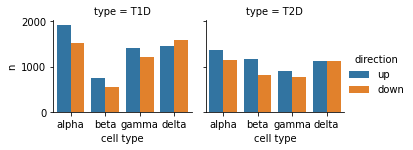

In [143]:
# N DE
n_de=[]
for name,summaries_sub in summaries.items():
    for name_sub,summary in summaries_sub.items():
        n_up=summary.query('padj<@FDR & logFC>@ALFC').shape[0]
        n_down=summary.query('padj<@FDR & logFC<-@ALFC').shape[0]
        print(name,name_sub,': fdr',FDR,', abs(lfc) > ',ALFC,':',
          'up',n_up,
          'down',n_down)
        n_de.append({'type':name,'cell type':name_sub,'direction':'up','n':n_up})
        n_de.append({'type':name,'cell type':name_sub,'direction':'down','n':n_down})
        
sb.catplot(x="cell type", y="n",
                hue="direction", col="type",
                data=pd.DataFrame(n_de), kind="bar",
                height=2, aspect=1.2)

## Enrichment

NOTE: Use as ref genes used after filtering in DE. Do enrichment separately for up/down genes, ..

In [9]:
# Ref genes - NOTE: in your vcase all genes used for DE
ref=adata_rn_b_sub.var['gene_symbol'].dropna().tolist()
ro.globalenv['ref']=ref

# Get gene sets
print('MSIGdb version:',ro.r(f'msigdb_version()'))
gene_sets_go=ro.r(f"msigdb_gsets_custom(species='Mus musculus',category='C5',subcategories=c('GO:BP','GO:CC','GO:MF'),size_range=c(5,500),filter_gene_sets=NULL,background=ref)")
gene_sets_kegg=ro.r(f"msigdb_gsets_custom(species='Mus musculus',category='C2',subcategories=c('KEGG'),size_range=c(5,500),filter_gene_sets=NULL,background=ref)")
gene_sets_reactome=ro.r(f"msigdb_gsets_custom(species='Mus musculus',category='C2',subcategories=c('REACTOME'),size_range=c(5,500),filter_gene_sets=NULL,background=ref)")
%R -i gene_sets_go -i gene_sets_kegg -i gene_sets_reactome -o gene_sets gene_sets=c(gene_sets_go,gene_sets_kegg,gene_sets_reactome)
print('N gene sets:',len(gene_sets))
ro.globalenv['gene_sets']=gene_sets

MSIGdb version: ['v7.2.1']
N gene sets: 10899


CL 1 N genes 47
N enriched gene sets: 25
Top enriched gene sets


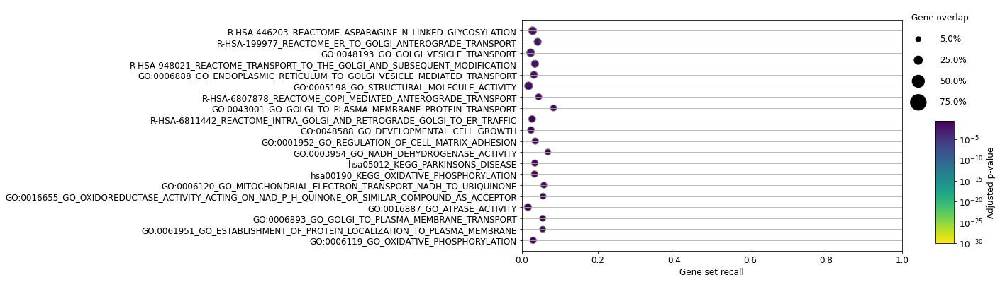

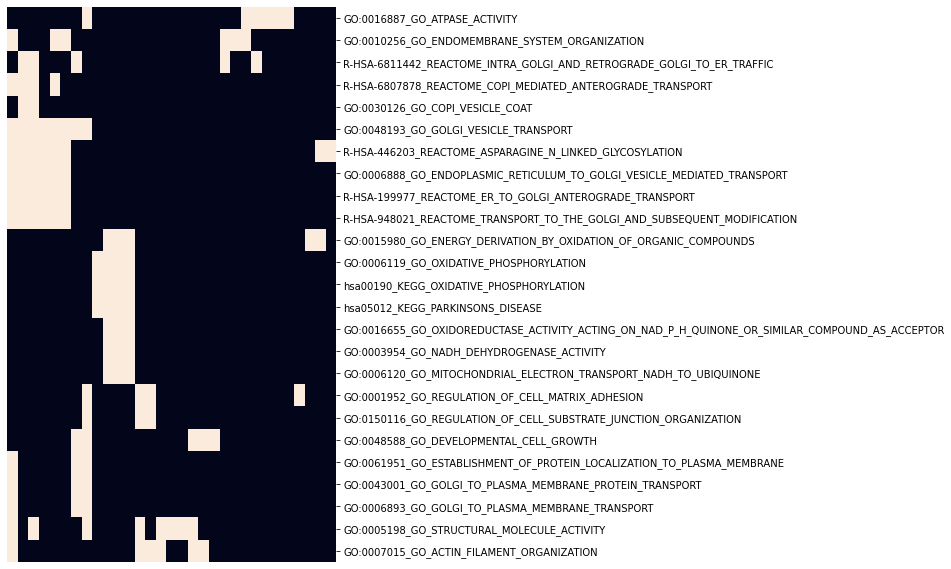

CL 2 N genes 111
N enriched gene sets: 131
Top enriched gene sets


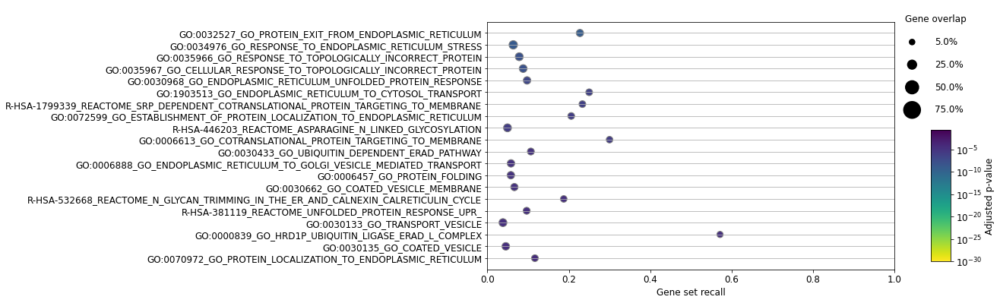

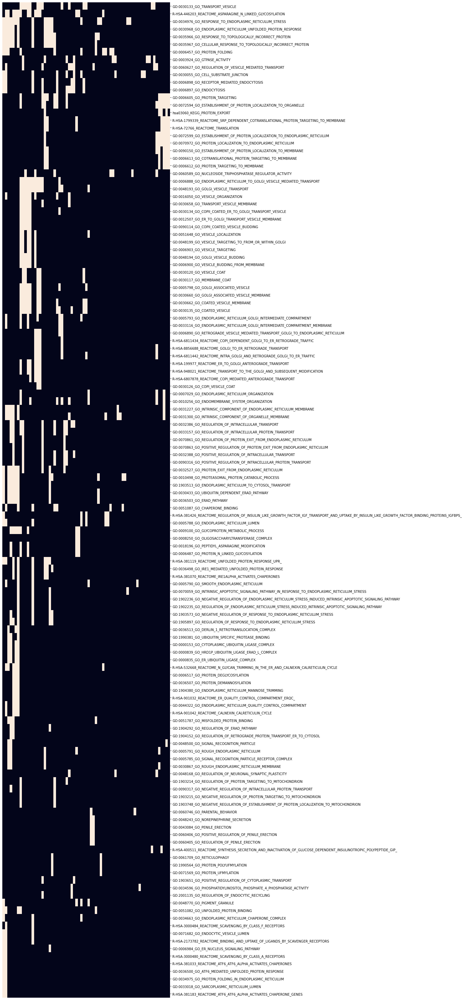

CL 3 N genes 228
N enriched gene sets: 7
Top enriched gene sets


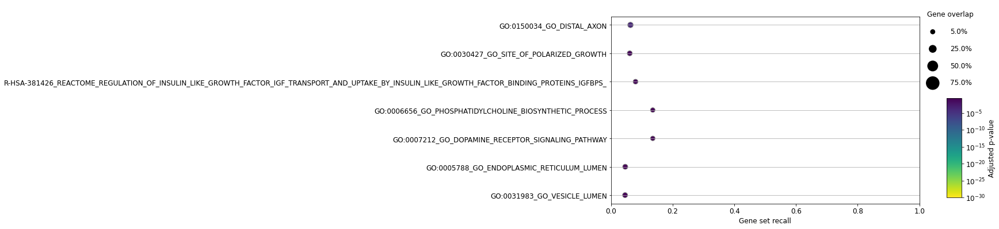

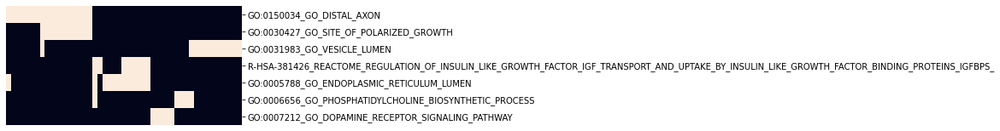

CL 4 N genes 209
N enriched gene sets: 270
Top enriched gene sets


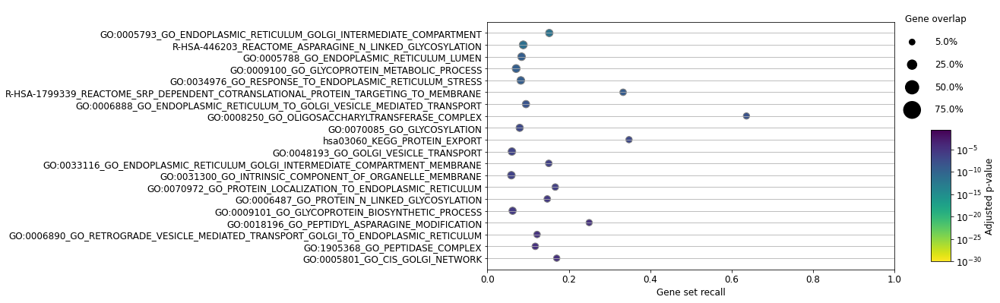

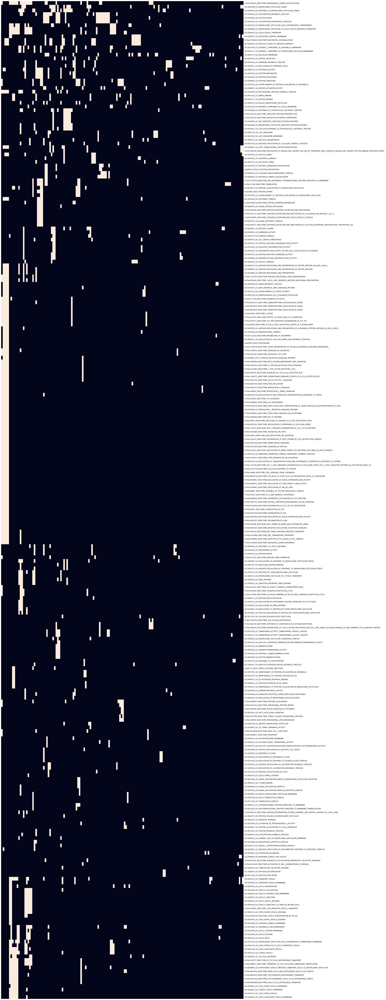

CL 5 N genes 14
N enriched gene sets: 0
CL 6 N genes 32
N enriched gene sets: 0
CL 7 N genes 16
N enriched gene sets: 32
Top enriched gene sets


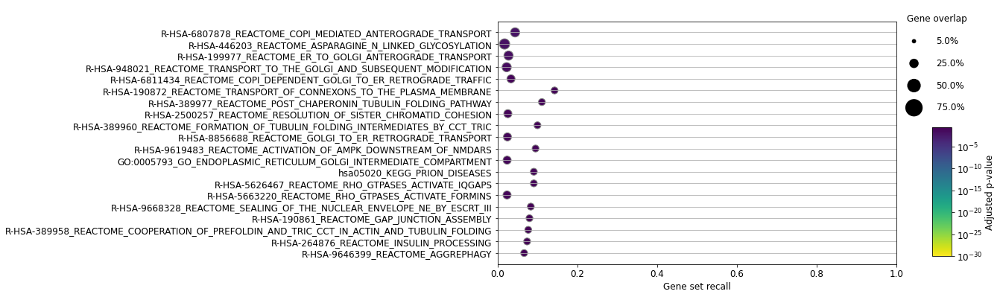

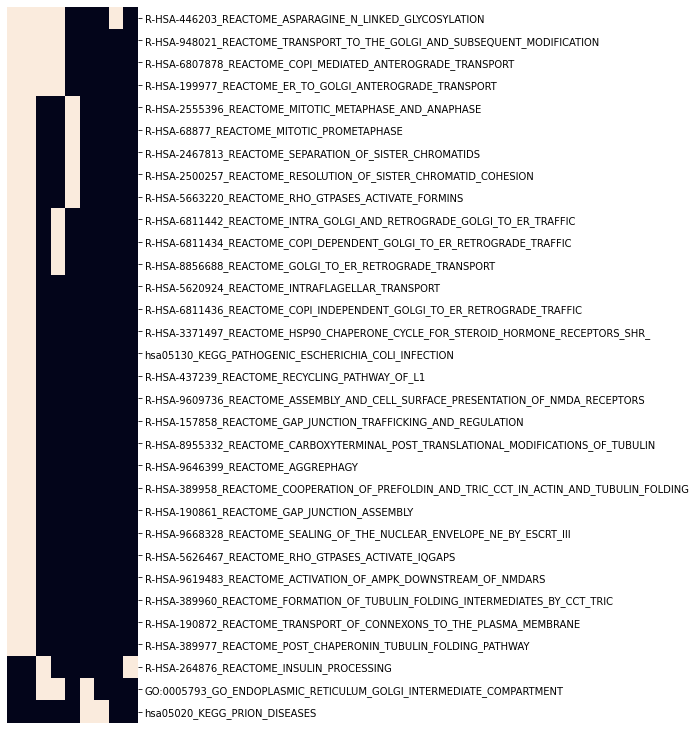

CL 8 N genes 42
N enriched gene sets: 1
Top enriched gene sets


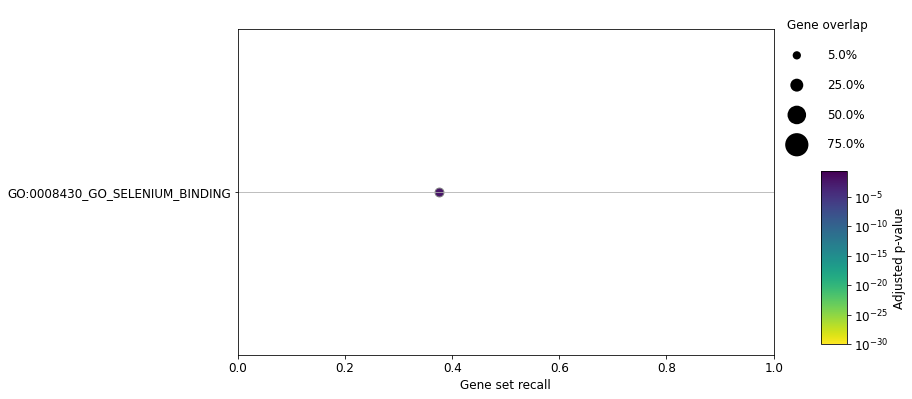

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/matrix.py:712: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.
  ax.set_ylim(0, max_dependent_coord * 1.05)
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/seaborn/matrix.py:1205: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(**tight_params)


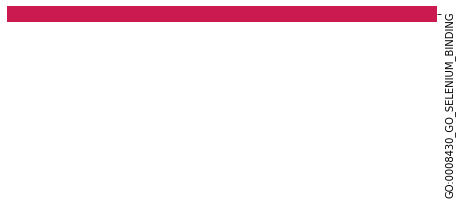

CL 9 N genes 58
N enriched gene sets: 109
Top enriched gene sets


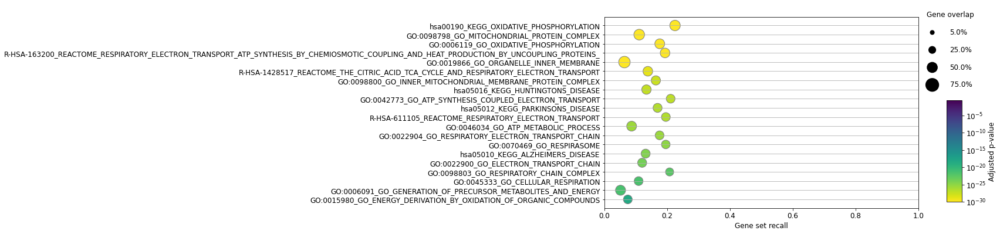

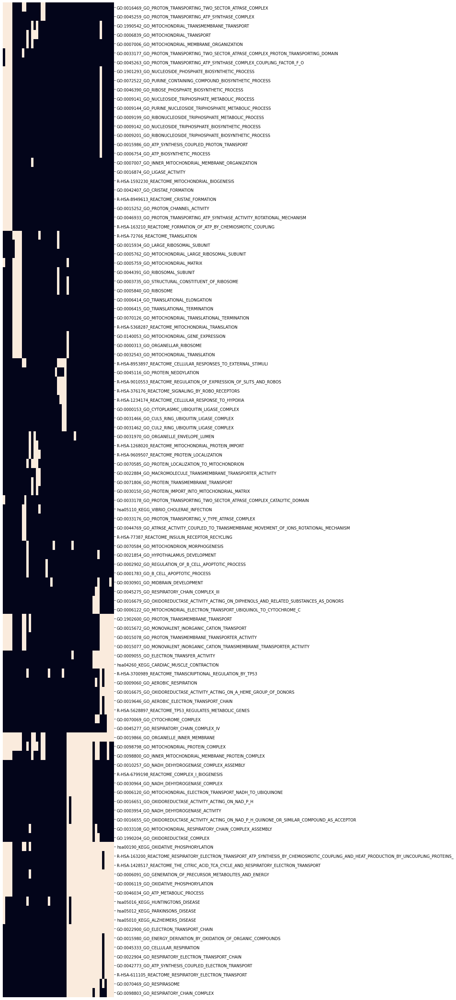

CL 10 N genes 79
N enriched gene sets: 113
Top enriched gene sets


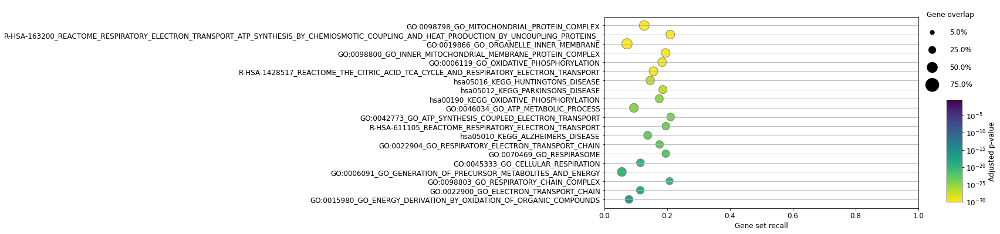

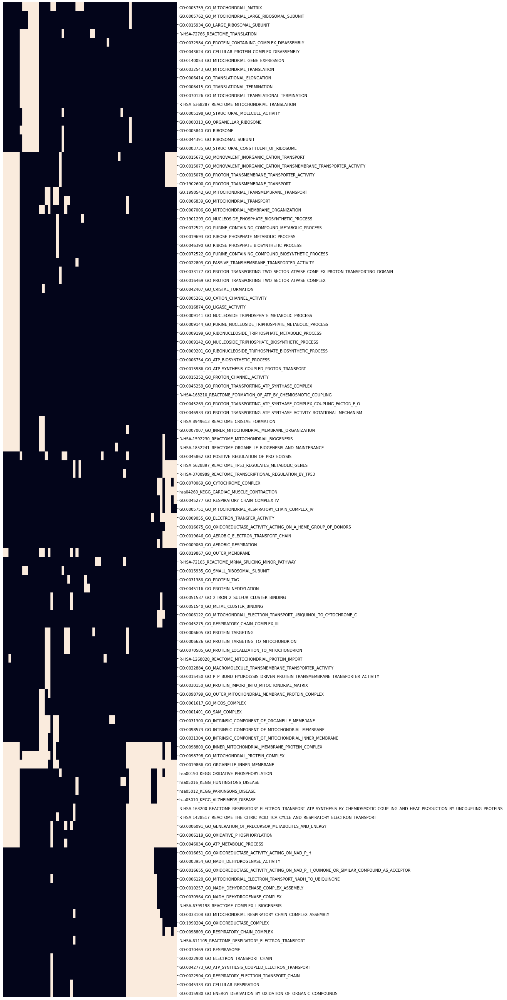

CL 11 N genes 46
N enriched gene sets: 328
Top enriched gene sets


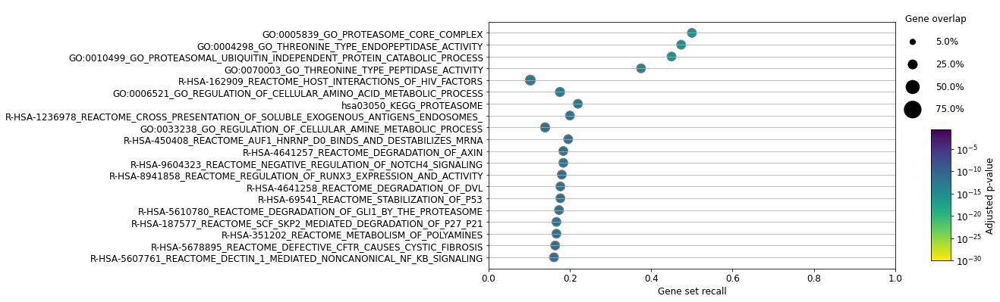

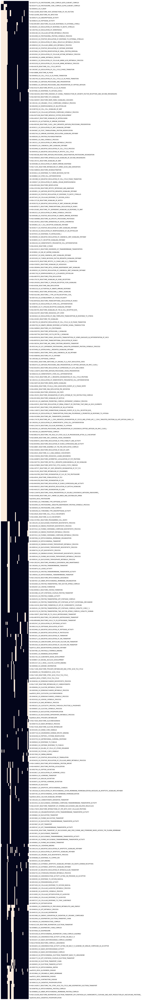

CL 12 N genes 45
N enriched gene sets: 22
Top enriched gene sets


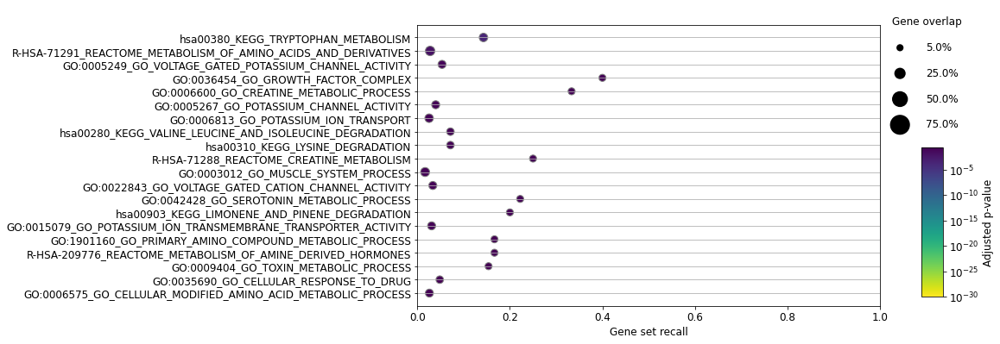

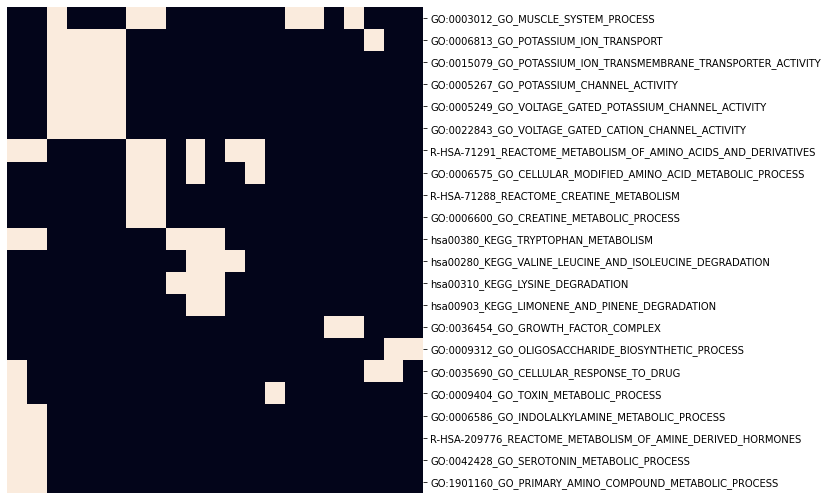

CL 13 N genes 108
N enriched gene sets: 66
Top enriched gene sets


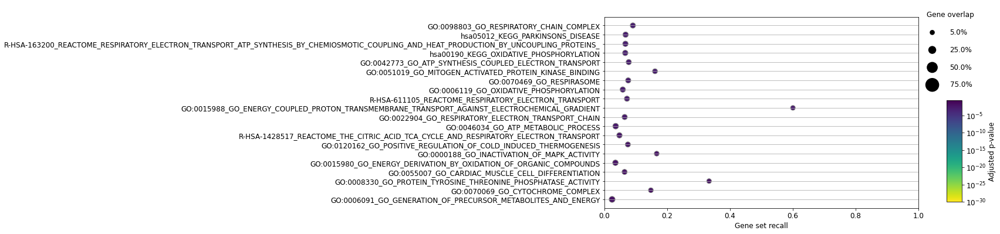

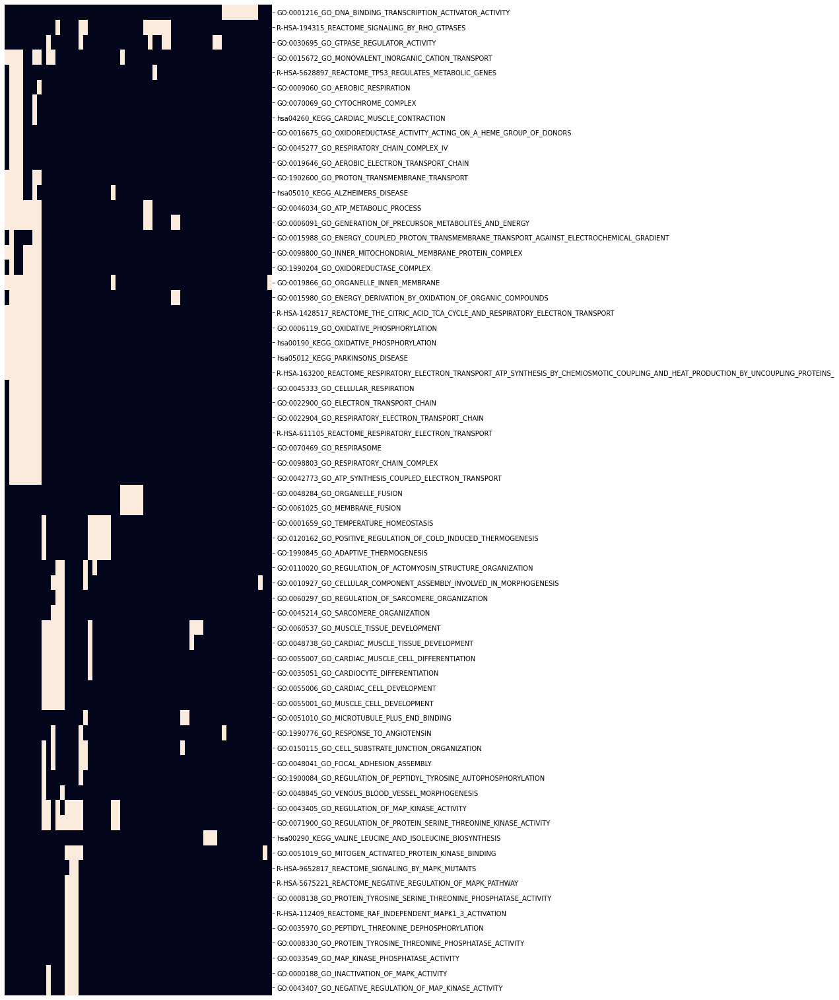

CL 14 N genes 15
N enriched gene sets: 37
Top enriched gene sets


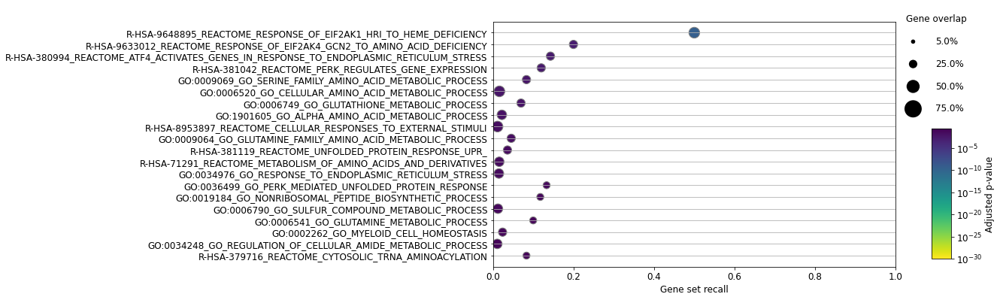

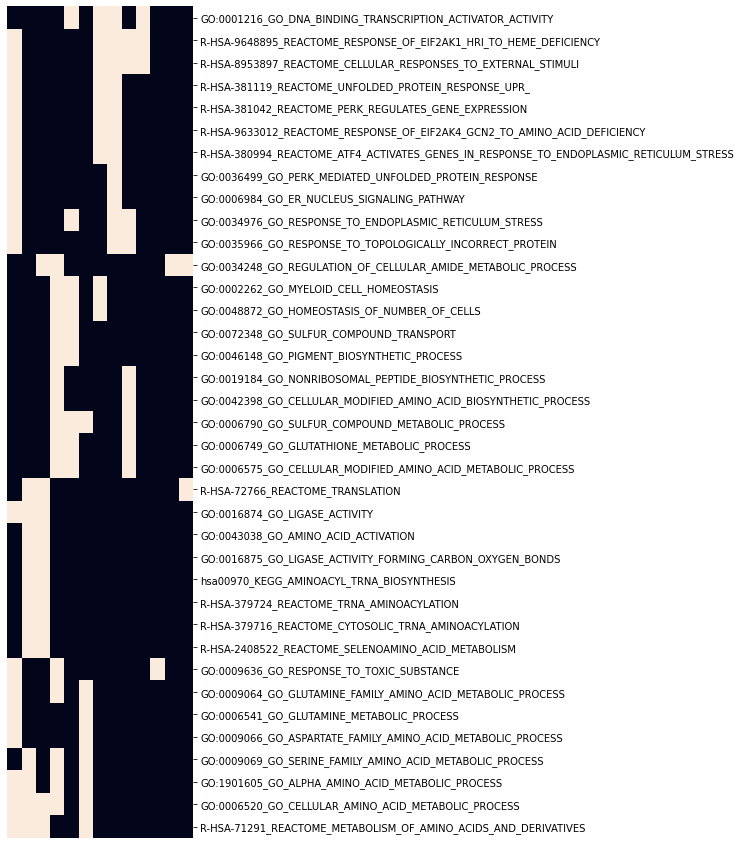

CL 15 N genes 47
N enriched gene sets: 249
Top enriched gene sets


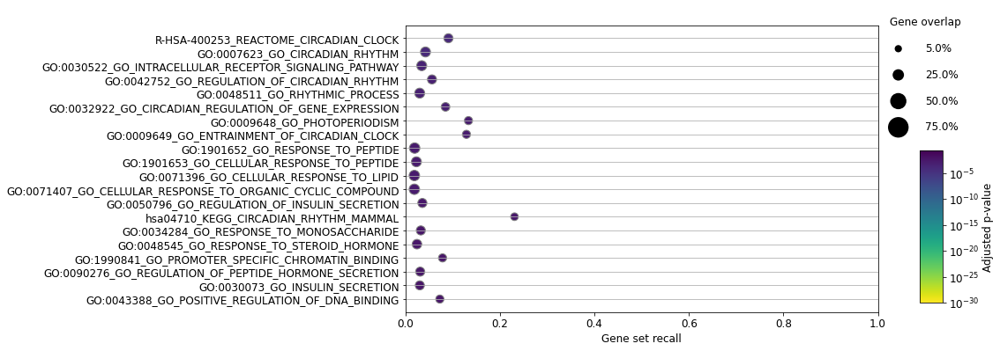

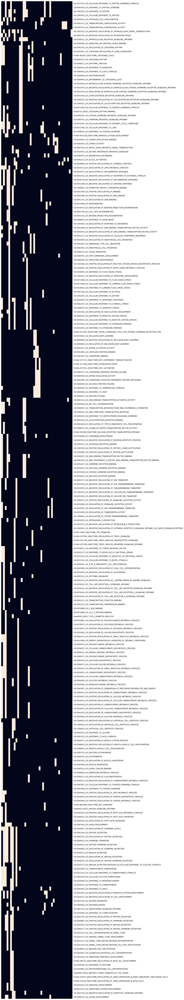

CL 16 N genes 67
N enriched gene sets: 159
Top enriched gene sets


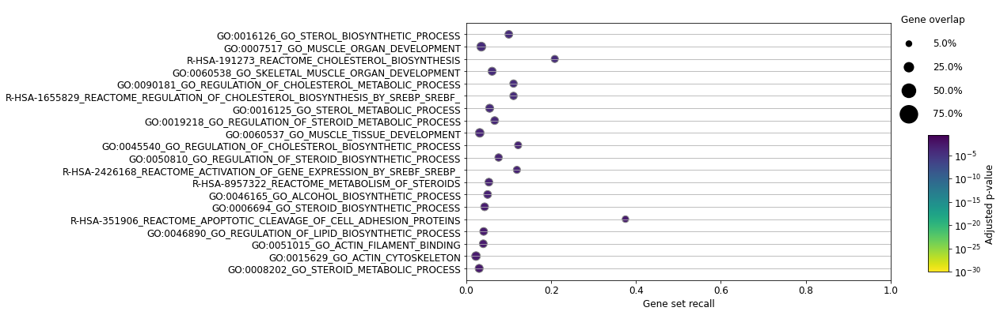

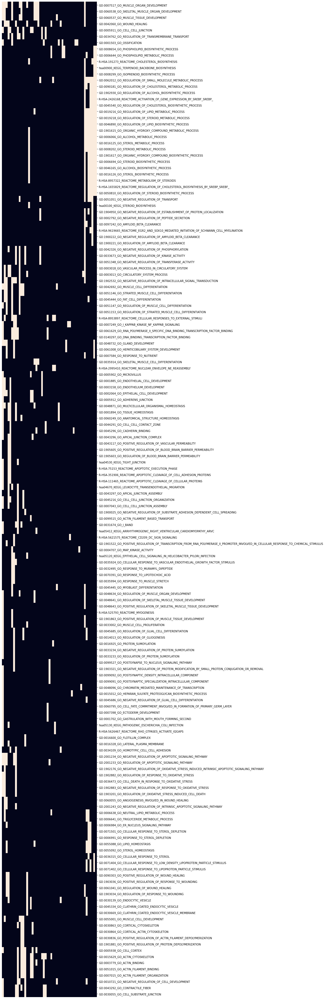

CL 17 N genes 50
N enriched gene sets: 4
Top enriched gene sets


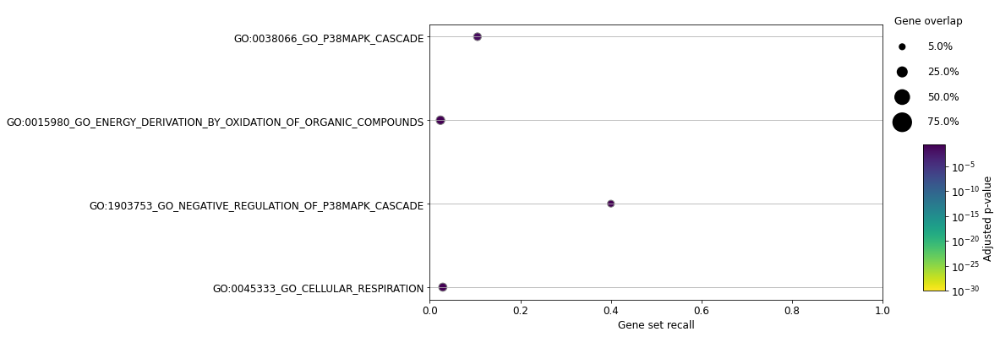

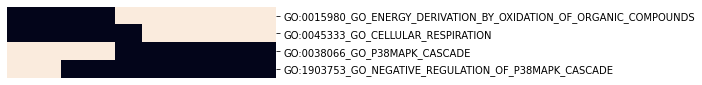

CL 18 N genes 16
N enriched gene sets: 0
CL 19 N genes 54
N enriched gene sets: 28
Top enriched gene sets


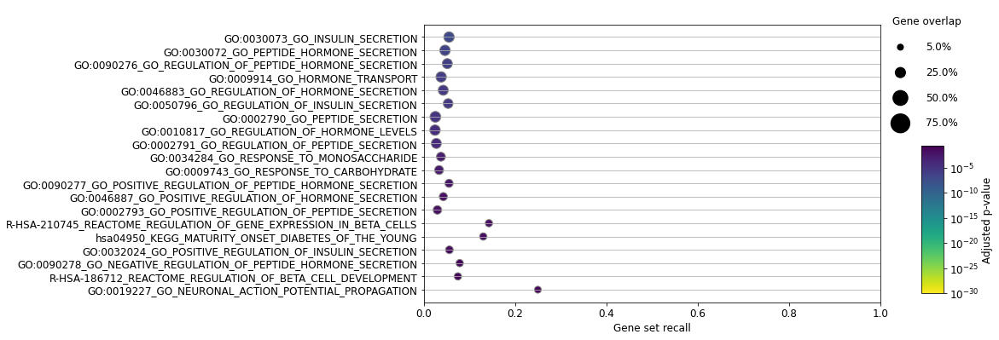

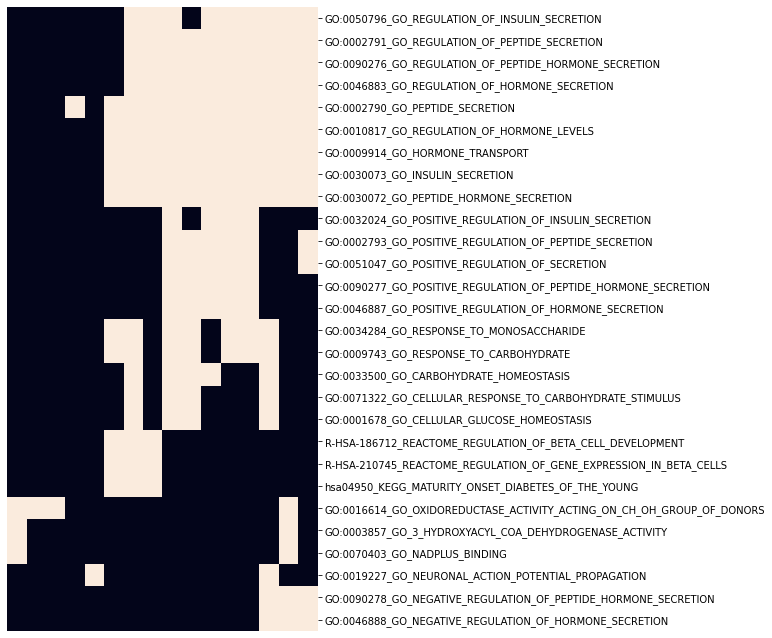

CL 20 N genes 61
N enriched gene sets: 29
Top enriched gene sets


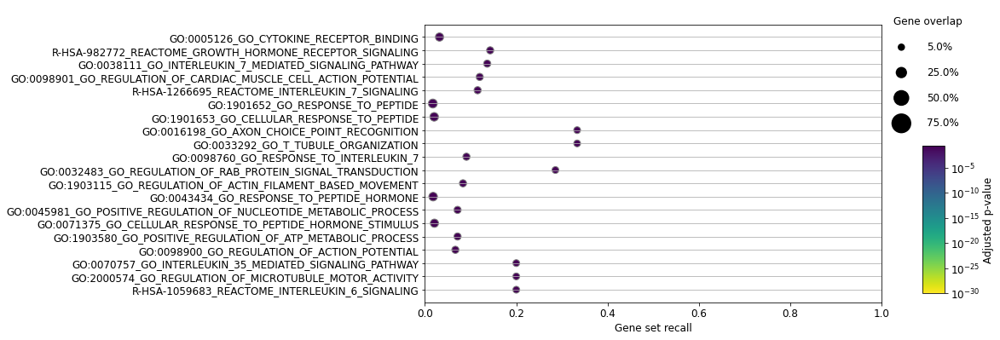

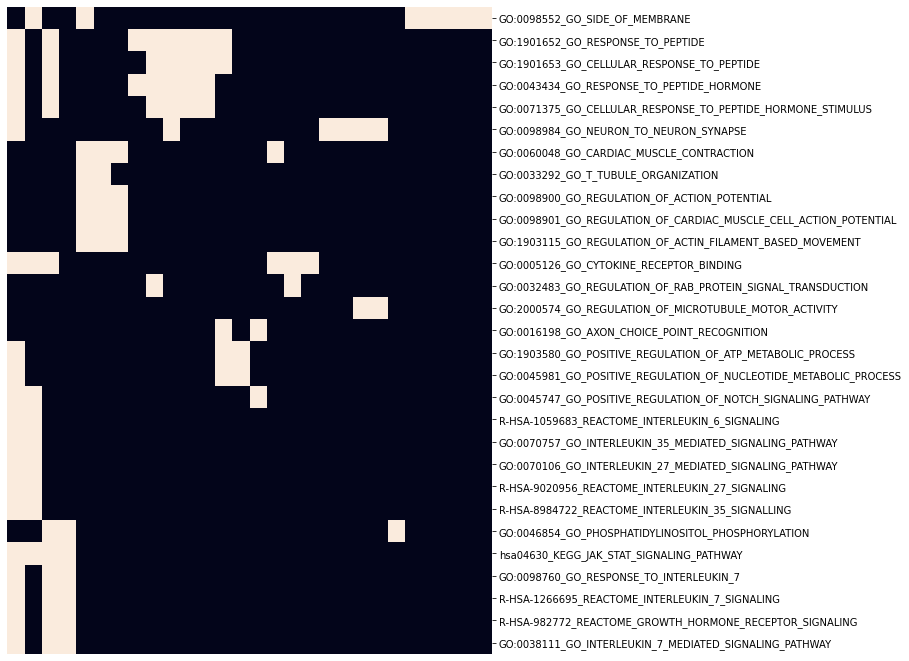

CL 21 N genes 40
N enriched gene sets: 11
Top enriched gene sets


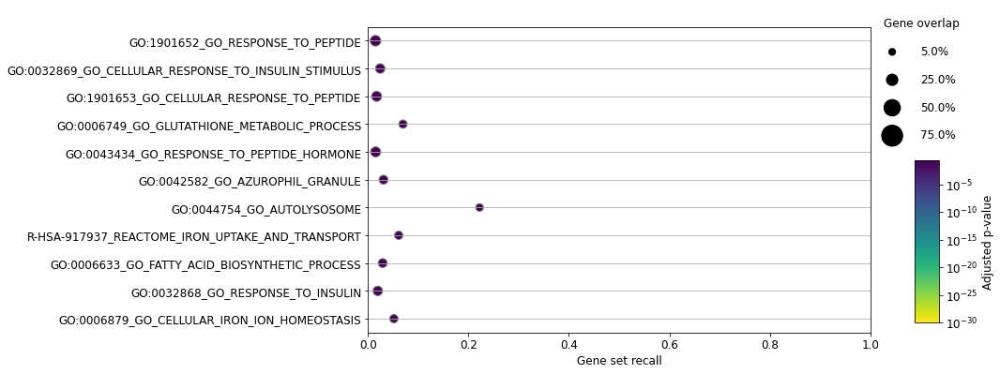

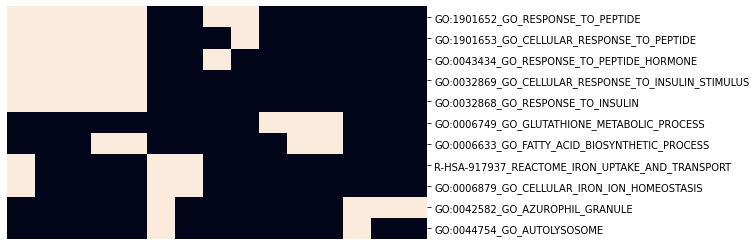

CL 22 N genes 18
N enriched gene sets: 0
CL 23 N genes 69
N enriched gene sets: 22
Top enriched gene sets


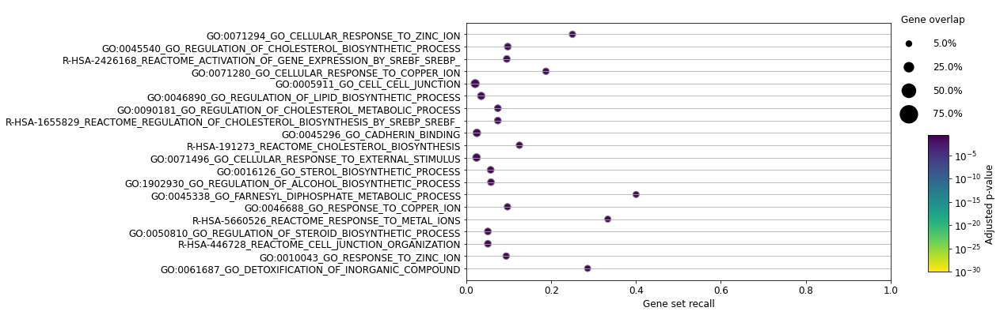

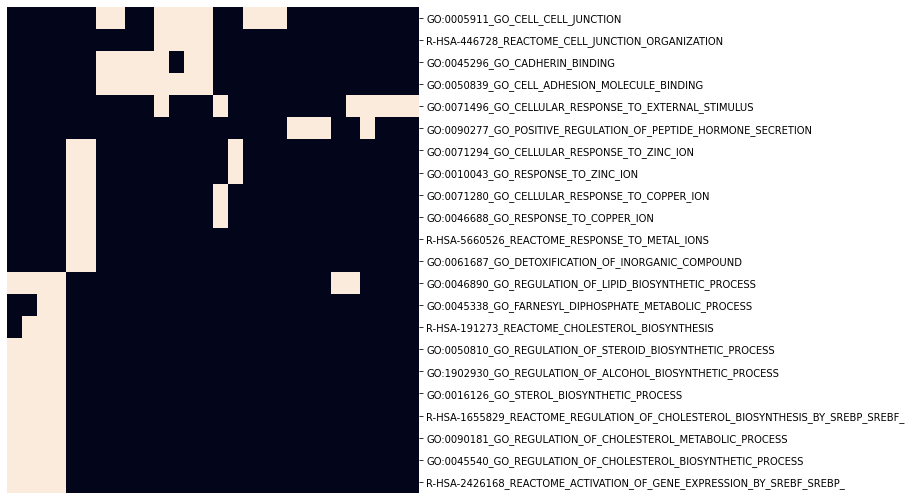

CL 24 N genes 52
N enriched gene sets: 6
Top enriched gene sets


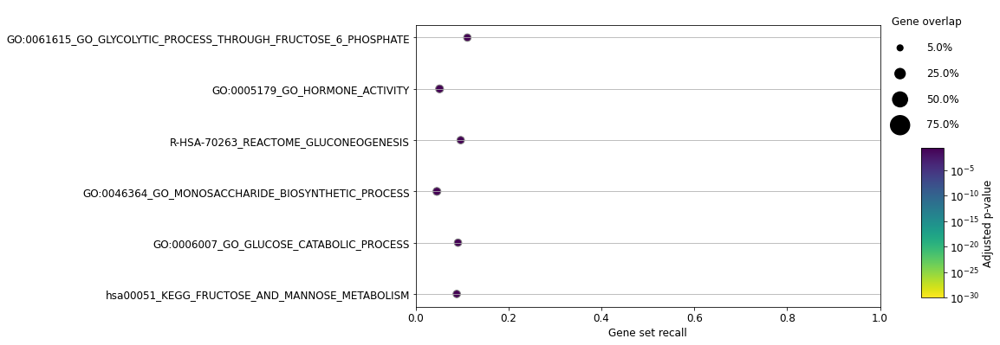

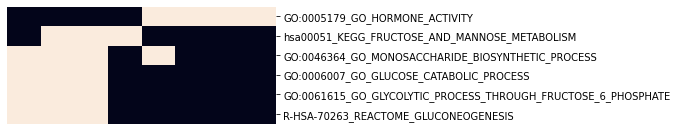

CL 25 N genes 50
N enriched gene sets: 119
Top enriched gene sets


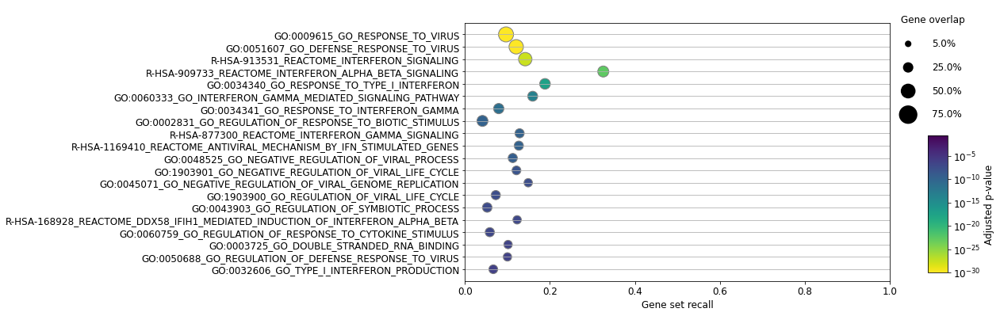

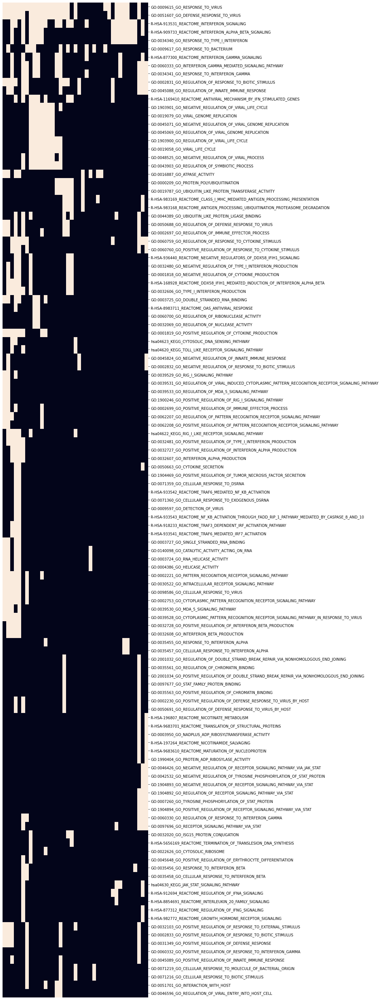

CL 26 N genes 46
N enriched gene sets: 111
Top enriched gene sets


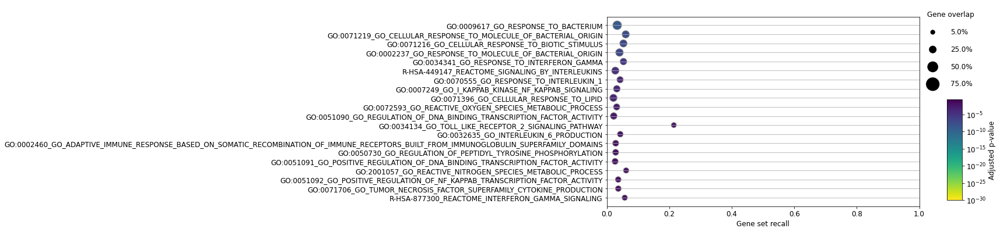

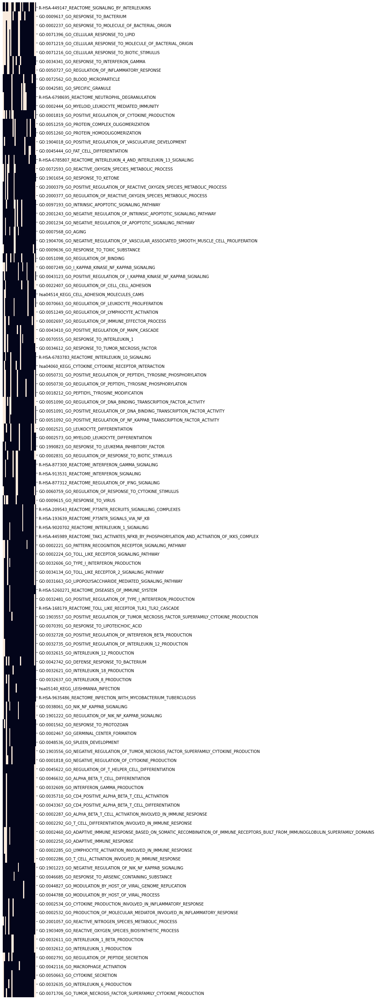

CL 27 N genes 67
N enriched gene sets: 146
Top enriched gene sets


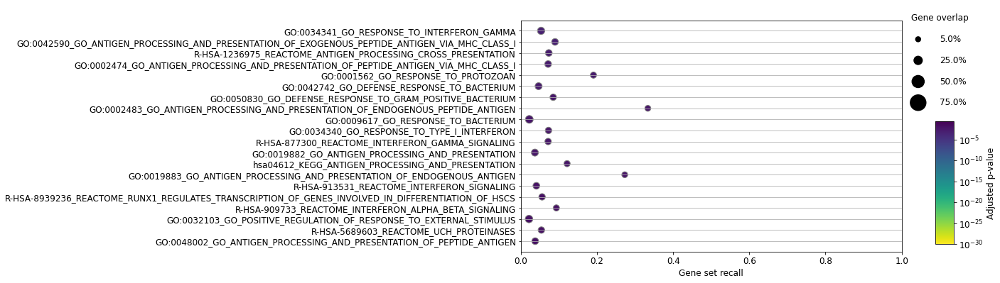

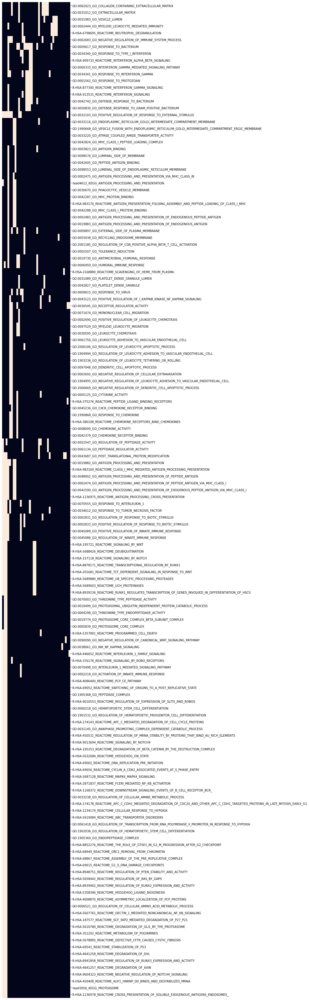

In [108]:
# Enrichment for multiple sets of genes
enrich_fdr=0.25
ro.globalenv['gs_fdr']=enrich_fdr
enrich_datas={}
for cl in sorted(adata_genes.obs['hc'].unique()):
    genes=adata_genes.obs.query('hc==@cl').index
    print('CL %i N genes %i'%(cl,len(genes)))
    # Map to gene symbols
    genes=adata_rn_b_sub.var.loc[genes,'gene_symbol'].dropna().tolist()

    # Calculate enrichment
    ro.globalenv['genes']=genes
    res=ro.r(f'hypeR(signature=as.vector(unlist(genes)),genesets=gene_sets,test = "hypergeometric",background =  as.vector(unlist(ref)),pval = 1,fdr = gs_fdr,plotting = FALSE,quiet = TRUE)')
    ro.globalenv['res']=res
    data=ro.r(f'res$data')
    enrich_datas[cl]=data
    print('N enriched gene sets:',data.shape[0])
    
    if data.shape[0]>0:
        # Plot top enriched gene sets
        print('Top enriched gene sets')
        data['recall']=data['overlap']/data['geneset']
        data['query_size']=len(genes)
        h.plot_enrich(data=data.rename(
            {'label':'name','fdr':'p_value','overlap':'intersection_size'},axis=1),
            n_terms=20, save=False,min_pval=10**-30, max_pval=enrich_fdr,percent_size=True,
               recall_lim=(0,1))
        h.plot_enr_heatmap(data=data,n_gs=None,xticklabels=False,yticklabels=True)
        
# Save enrichment tables
writer = pd.ExcelWriter(path_save+'gene_hc_t'+str(cut_thresh)+'_enrichment.xlsx',
                        engine='xlsxwriter') 
for sheet,data in enrich_datas.items():
    data.to_excel(writer, sheet_name=str(sheet))   
writer.save()

## Plot metadata and DE gene expression
NOTE: Make embedding of beta cells only (e.g. recompute PCA, neighbours, and UMAP). Since you do not have integrated data across studies just do per-study plots. Plot age, sex, etc. and top DE genes.